In [ ]:
!pip install ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 613.6/613.6 kB 6.4 MB/s eta 0:00:00


In [ ]:
!pip install wandb

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 10.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 188.6/188.6 kB 16.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 218.8/218.8 kB 12.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 8.4 MB/s eta 0:00:00
  Created wheel for pathtools: filename=pathtools-0.1.2-py3-none-any.whl size=8791 sha256=f92ffad1074c540fdb992d831d5e931b955ecbe58c15cc86bf6570c0a0d6fa02
  Stored in directory: /root/.cache/pip/wheels/e7/f3/22/152153d6eb222ee7a56ff8617d80ee5207207a8c00a7aab794
Successfully built pathtools


In [ ]:
!unzip data.zip

Archive:  data.zip
 extracting: README.dataset.txt      
 extracting: README.roboflow.txt     
   creating: test/
 extracting: test/1653344614275_jpg.rf.10b450f4510e67b5ded8f29c96ceb18f.jpg  
 extracting: test/1653344614275_jpg.rf.10b450f4510e67b5ded8f29c96ceb18f.txt  
 extracting: test/1653344650706_jpg.rf.c76d99ca0b1ae17f2e1df24222f794b1.jpg  
 extracting: test/1653344650706_jpg.rf.c76d99ca0b1ae17f2e1df24222f794b1.txt  
 extracting: test/1653344811214_jpg.rf.946ec126b41a9f2a438d8f35cda35516.jpg  
 extracting: test/1653344811214_jpg.rf.946ec126b41a9f2a438d8f35cda35516.txt  
 extracting: test/1653345352809_jpg.rf.3a9573384360b185ff011ad461b3dc92.jpg  
 extracting: test/1653345352809_jpg.rf.3a9573384360b185ff011ad461b3dc92.txt  
 extracting: test/1653345524539_jpg.rf.ed3d059afcf83845bbb88e9ec7a8c3a7.jpg  
 extracting: test/1653345524539_jpg.rf.ed3d059afcf83845bbb88e9ec7a8c3a7.txt  
 extracting: test/1653345713110_jpg.rf.202904ea07aaddfb00820995ff342934.jpg  
 extracting: test/1653345713

**Read all data in folders**

In [ ]:
import os
train_data = os.listdir("train")
test_data = os.listdir("test")
val_data = os.listdir("valid")

**Create images and labels folders at each folder to build the model**

In [ ]:
folders = ['test', 'valid', 'train']
for folder in folders:
  os.makedirs(os.path.join(folder, 'labels'))
  os.makedirs(os.path.join(folder, 'images'))

**Move all images (.jpg) in images folder and all annotation files (.txt) to labels folder**

In [ ]:
import shutil
lst = ['train', 'test', 'valid']
paths = [train_data, test_data, val_data]
cnt = 0
for p in paths:
  for file_name in p:
    dest_path = ''
    if '.txt' in file_name:
      dest_path = lst[cnt]+'/labels'
    elif '.jpg' in file_name:
      dest_path = lst[cnt]+'/images'
    else:
      continue
    destination_path = os.path.join(dest_path, file_name)
    source_path = os.path.join(lst[cnt], file_name)
    shutil.move(source_path, destination_path)
  cnt += 1

**Create labels dictionary to create the .yaml file to build the model**

In [ ]:
file_path = '/content/train/_darknet.labels'
label_dict = {}
cnt=0
with open(file_path, 'r') as file:
  lines = file.readlines()
  lst = [line.strip() for line in lines]
  for i in lst:
    label_dict[cnt] = i
    cnt += 1
print(label_dict)

{0: 'bicycles', 1: 'buses', 2: 'crosswalks', 3: 'fire hydrants', 4: 'motorcycles', 5: 'traffic lights', 6: 'vehicles'}


In [ ]:
!wandb login

wandb: Logging into wandb.ai. (Learn how to deploy a W&B server locally: https://wandb.me/wandb-server)
wandb: You can find your API key in your browser here: https://wandb.ai/authorize
wandb: Paste an API key from your profile and hit enter, or press ctrl+c to quit: 
wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


**Apply data augmentation on the training data to increase the number of images**

In [ ]:
import cv2
import albumentations as A
import numpy as np
from google.colab.patches import cv2_imshow
from PIL import Image

def txt_to_list(path):
  lines = []

  with open(path, 'r') as file:
      for line in file:
          line = line.split()
          line = [float(i) for i in line]
          tmp = line[0]
          line.pop(0)
          line.append(tmp)
          lines.append(line)
  return lines


train_images = os.listdir('/content/train/images')

transformers = [A.Compose([A.ToGray(p=1)], bbox_params=A.BboxParams(format='yolo')),
                A.Compose([A.Rotate(p=1)], bbox_params=A.BboxParams(format='yolo')),
                A.Compose([A.RandomBrightnessContrast(p=1)], bbox_params=A.BboxParams(format='yolo')),
                A.Compose([A.VerticalFlip(p=1)], bbox_params=A.BboxParams(format='yolo')),
                A.Compose([A.ShiftScaleRotate(scale_limit=0.20, rotate_limit=10, shift_limit=0.1, p=1, border_mode=cv2.BORDER_CONSTANT, value=0)], bbox_params=A.BboxParams(format='yolo'))
                ]
num_augmented_images = 5

for img in train_images:

  image_path = os.path.join('/content/train/images', img)
  print(image_path)
  image = cv2.imread(image_path)
  image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
  bboxes = txt_to_list(os.path.join('/content/train/labels', img.replace('.jpg', '.txt')))
  for cnt in range(num_augmented_images):
    transformed = transformers[cnt](image=image, bboxes=bboxes)
    transformed_image = transformed['image']
    transformed_bboxes = transformed['bboxes']
    transformed_bboxes2 = []
    cv2.imwrite('/content/train/images/'+str(cnt)+img, transformed_image)
    for box in transformed_bboxes:
      box2=list(box)
      tmp = int(box2[4])
      box2 = box2[:-1]
      box2.insert(0, tmp)
      box2 = [str(i) for i in box2]
      transformed_bboxes2.append(box2)
    file = open('/content/train/labels/'+str(cnt)+img.replace('.jpg', '.txt'),'w')
    for line in transformed_bboxes2:
      file.write(' '.join(line)+'\n')
    file.close()

**Check the number of training set after applying augmentation**

In [ ]:
x = os.listdir('/content/train/images')
print(len(x))

2964


**Create .yaml file to train the model**

In [ ]:
import yaml
data = {
    'path': '/content/',
    'train': 'train/images',
    'val': 'valid/images',
    'test': 'test/images',
    'names': label_dict
}
with open('data.yaml', 'w') as yaml_file:
    yaml.dump(data, yaml_file)

**Load the model (yolov8s)**

In [ ]:
from ultralytics import YOLO
model2 = YOLO('yolov8s.pt')

results = model2.train(data='/content/data.yaml', epochs=10, batch=4)

100%|██████████| 21.5M/21.5M [00:00<00:00, 156MB/s]
Ultralytics YOLOv8.0.169 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8s.pt, data=/content/data.yaml, epochs=10, patience=50, batch=4, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=None, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, vid_stride=1, stream_buffer=False, line_width=None, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, boxes=T

**get the best model**

In [ ]:
model2 = YOLO('/content/runs/detect/train2/weights/best.pt')

**Evaluate the model on the test set**

In [ ]:
metrics = model2.val(conf = 0.4, iou=0.5, split = 'test')

Ultralytics YOLOv8.0.169 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 11128293 parameters, 0 gradients
val: Scanning /content/test/labels.cache... 133 images, 7 backgrounds, 0 corrupt: 100%|██████████| 133/133 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:06<00:00,  1.35it/s]
                   all        133        506      0.766        0.6      0.718      0.474
              bicycles        133         22      0.786        0.5       0.68       0.43
                 buses        133         12      0.583      0.583      0.644      0.552
            crosswalks        133         81      0.896      0.531      0.717      0.403
         fire hydrants        133         23      0.824      0.609      0.758      0.547
           motorcycles        133         30      0.645      0.667      0.744       0.46
        traffic lights        133        129      

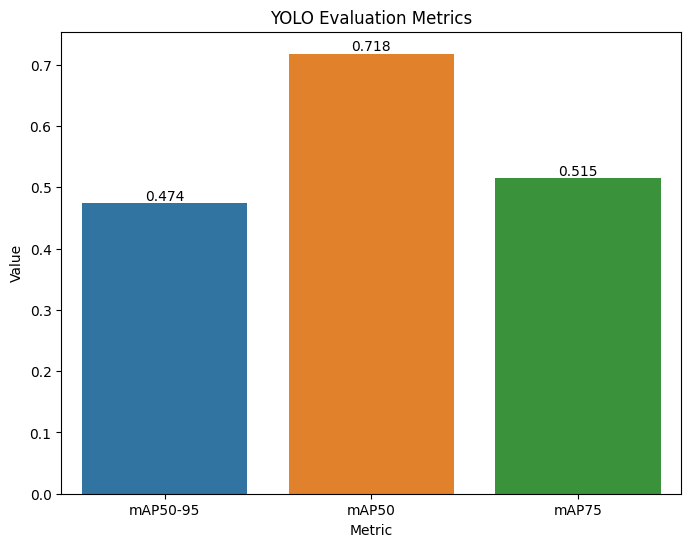

In [ ]:
%matplotlib inline
import seaborn as sns
import matplotlib.pyplot as plt

ax = sns.barplot(x=['mAP50-95', 'mAP50', 'mAP75'], y=[metrics.box.map, metrics.box.map50, metrics.box.map75])


ax.set_title('YOLO Evaluation Metrics')
ax.set_xlabel('Metric')
ax.set_ylabel('Value')

fig = plt.gcf()
fig.set_size_inches(8, 6)

for p in ax.patches:
    ax.annotate('{:.3f}'.format(p.get_height()), (p.get_x() + p.get_width() / 2, p.get_height()), ha='center', va='bottom')

plt.show()

(-0.5, 2999.5, 2249.5, -0.5)

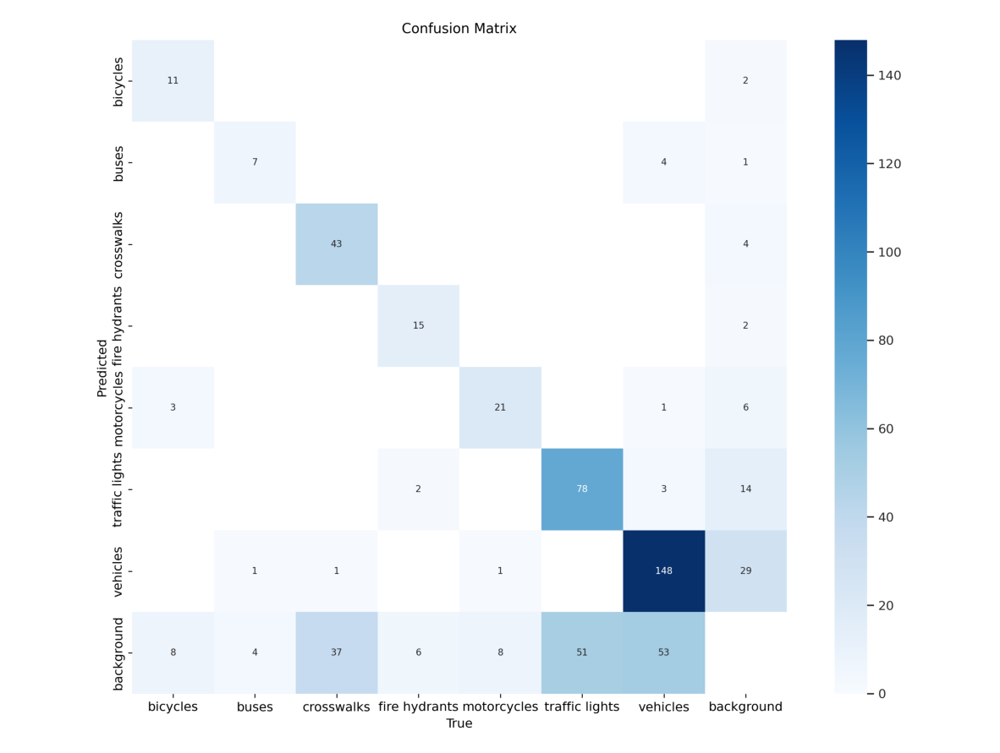

In [ ]:
%matplotlib inline
import matplotlib.image as mpimg
img = mpimg.imread('/content/runs/detect/val3/confusion_matrix.png')

fig, ax = plt.subplots(figsize = (15, 15))

ax.imshow(img)
ax.axis('off')

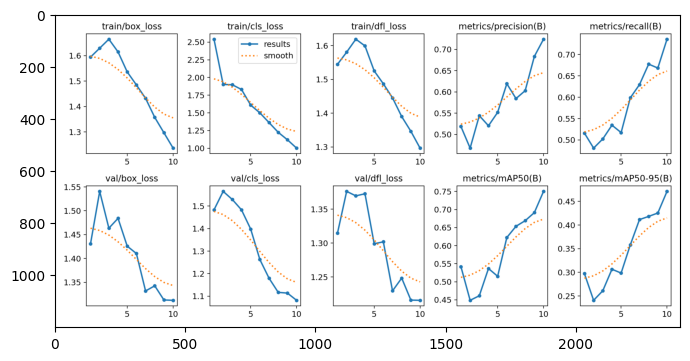

In [ ]:
%matplotlib inline
from PIL import Image
Img = np.asarray(Image.open('/content/runs/detect/train2/results.png'))
plt.imshow(Img)

**Test model on random test images**


image 1/1 /content/test/images/1653754589315_jpg.rf.639fb358ad2209a2ae8bb03c06274d09.jpg: 640x640 1 vehicles, 16.3ms
Speed: 2.5ms preprocess, 16.3ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/test/images/1656170014083_jpg.rf.aaae0b4ab95888c43a011840d131537b.jpg: 640x640 2 vehicless, 16.3ms
Speed: 2.5ms preprocess, 16.3ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/test/images/1653771248219_jpg.rf.8f7d717a256d2bed7451ef31ccd599e0.jpg: 640x640 4 traffic lightss, 3 vehicless, 16.3ms
Speed: 2.1ms preprocess, 16.3ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/test/images/1656251239045_jpg.rf.280063c4fa20c733b40284beda5b3115.jpg: 640x640 1 crosswalks, 1 fire hydrants, 3 motorcycless, 17.8ms
Speed: 1.7ms preprocess, 17.8ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/test/images/1653759556229_jpg.rf.fc3b6d2b57e83265906f7f7812eea47

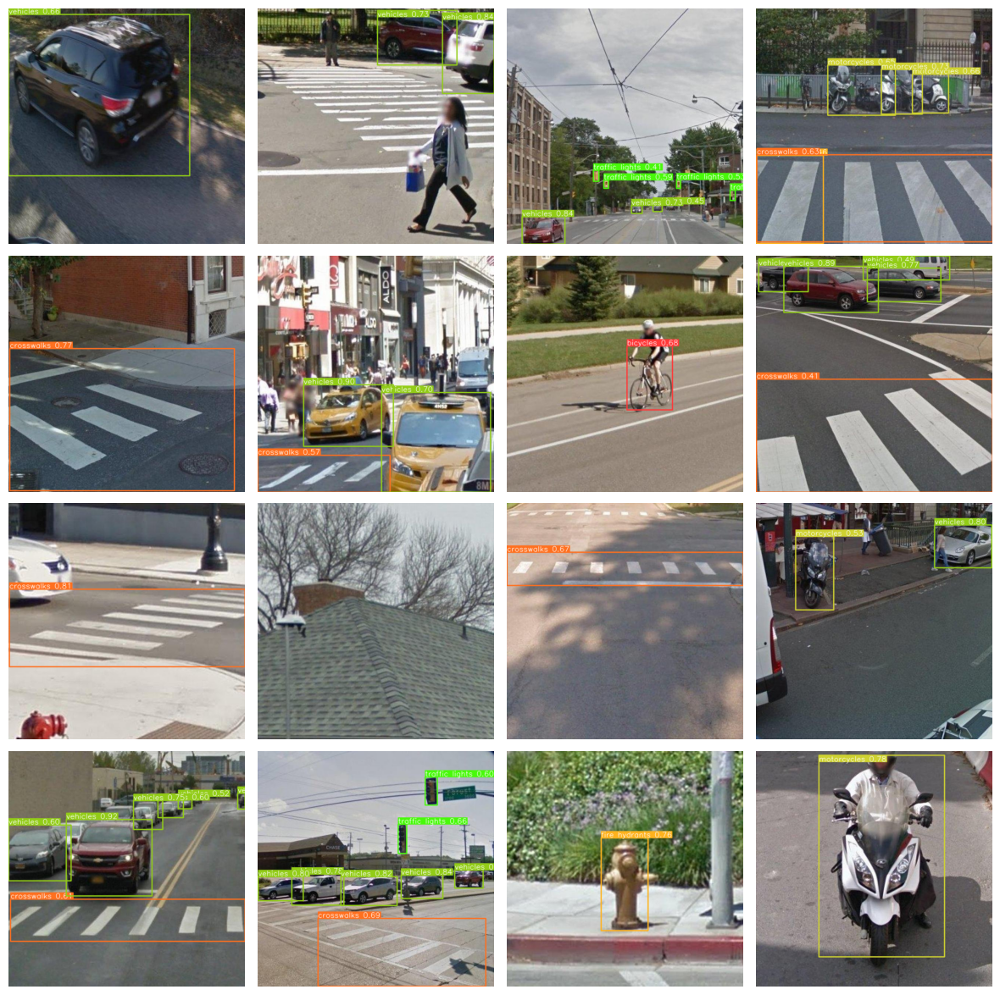

In [ ]:
import random
import cv2

custom_image_dir = '/content/test/images'
image_files = os.listdir(custom_image_dir)

selected_images = random.sample(image_files, 16)

fig, axes = plt.subplots(nrows=4, ncols=4, figsize=(15, 15))

for i, img_file in enumerate(selected_images):

    row_idx = i // 4
    col_idx = i % 4

    img_path = os.path.join(custom_image_dir, img_file)
    detect_result = model2.predict(source=img_path, conf=0.4, iou=0.5)
    detect_img = detect_result[0].plot()
    detect_img = cv2.cvtColor(detect_img, cv2.COLOR_BGR2RGB)

    axes[row_idx, col_idx].imshow(detect_img)
    axes[row_idx, col_idx].axis('off')


plt.subplots_adjust(wspace=0.05, hspace=0.05)

**Test model on video**

In [ ]:
import imageio
import time
def detect_objects_in_image(img):
      detect_result = model2.predict(source=img, conf=0.4, iou=0.5)
      detect_img = detect_result[0].plot()
      detect_img = cv2.cvtColor(detect_img, cv2.COLOR_BGR2RGB)
      return detect_img

def detect_objects_in_video(input_video):
    print(f'Running inference for {input_video}.mp4... ', end='')

    video_reader = imageio.get_reader(f'{input_video}.mp4')
    video_writer = imageio.get_writer(f'{input_video}_annotated.mp4', fps=10)

    # loop through and process each frame
    t0 = time.time()
    n_frames = 0
    for frame in video_reader:
        n_frames += 1
        new_frame = detect_objects_in_image(frame)

        # instead of plotting image, we write the frame to video
        video_writer.append_data(new_frame)

    fps = n_frames / (time.time() - t0)
    print("Frames processed: %s, Speed: %s fps" % (n_frames, fps))

    # clean up
    video_writer.close()

In [ ]:
detect_objects_in_video('/content/traffic_-_27260 (720p)')

Running inference for /content/traffic_-_27260 (720p).mp4... 


0: 384x640 3 vehicless, 106.8ms
Speed: 5.5ms preprocess, 106.8ms inference, 2.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 vehicless, 12.2ms
Speed: 11.2ms preprocess, 12.2ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 vehicless, 11.1ms
Speed: 5.0ms preprocess, 11.1ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 vehicless, 11.1ms
Speed: 1.9ms preprocess, 11.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 vehicless, 11.1ms
Speed: 2.4ms preprocess, 11.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 vehicless, 11.1ms
Speed: 2.2ms preprocess, 11.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 vehicless, 11.1ms
Speed: 1.7ms preprocess, 11.1ms inference, 2.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 vehicless, 12.2ms
Speed: 5.3ms preprocess, 12.2ms inference, 2.5ms postprocess p

Frames processed: 335, Speed: 10.337406947163323 fps


In [ ]:
from IPython.display import HTML
from base64 import b64encode

def play(filename):
    html = ''
    video = open(filename,'rb').read()
    src = 'data:video/mp4;base64,' + b64encode(video).decode()
    html += '<video width=1000 controls autoplay loop><source src="%s" type="video/mp4"></video>' % src
    return HTML(html)

play('/content/traffic_-_27260 (720p)_annotated.mp4')

In [ ]:
import locale
locale.getpreferredencoding = lambda: "UTF-8"
!pip install roboflow

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.6/57.6 kB 1.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 155.3/155.3 kB 7.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 178.7/178.7 kB 20.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 8.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.8/67.8 kB 9.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 63.3/63.3 kB 8.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 6.7 MB/s eta 0:00:00
  Created wheel for wget: filename=wget-3.2-py3-none-any.whl size=9655 sha256=7e99a3e57bc04aafeb7999735d13948f119d230a475eac87dba889b1da155242
  Stored in directory: /root/.cache/pip/wheels/8b/f1/7f/5c94f0a7a505ca1c81cd1d9208ae2064675d97582078e6c769
Successfully built wget
  Attempting uninstall: pyparsing
    Found existing installation: pyparsing 3.1.1
    Uninstalling pyparsing-3.1.1:
      

**Model Deployment on Roboflow**




In [ ]:
from roboflow import Roboflow
rf = Roboflow(api_key="JbbQlgpA1ddRyeRvEQAG")
project = rf.workspace("traffic-5wyfb").project("road_traffic")
dataset = project.version(1).download("yolov8")
project.version(dataset.version).deploy(model_type="yolov8", model_path=f"/content/runs/detect/train2")

loading Roboflow workspace...
loading Roboflow project...
Dependency ultralytics==8.0.134 is required but found version=8.0.169, to fix: `pip install ultralytics==8.0.134`


Extracting Dataset Version Zip to Road_traffic-1 in yolov8:: 100%|██████████| 1540/1540 [00:00<00:00, 1698.53it/s]


Dependency ultralytics==8.0.134 is required but found version=8.0.169, to fix: `pip install ultralytics==8.0.134`
View the status of your deployment at: https://app.roboflow.com/traffic-5wyfb/road_traffic/1
Share your model with the world at: https://universe.roboflow.com/traffic-5wyfb/road_traffic/model/1
